In [1]:
import glob
import gc
import random

import numpy as np
import pandas as pd

import torch

import matplotlib.pyplot as plt
import seaborn as sns

import scanpy as sc

import hnoca.snapseed as snap
from hnoca.snapseed.utils import read_yaml

import jax.numpy as jnp

# Monkey patch for older JAX versions
if not hasattr(jnp, "trapezoid"):
    jnp.trapezoid = jnp.trapz

%matplotlib inline

sc.settings.n_jobs = 25

random.seed(0)
np.random.seed(0)
sc.settings.seed = 0

torch.set_float32_matmul_precision("high")

In [2]:
## Read In Data ##

adata = sc.read_h5ad('/mnt/sdb/scz_meta_analysis_processed/anndata_objs/integrated_adata.h5ad')
adata_hvg = sc.read_h5ad('/mnt/sdb/scz_meta_analysis_processed/anndata_objs/integrated_adata_hvg.h5ad')
adata.obsm = adata_hvg.obsm

In [3]:
## Import Clustering & DGE Data ##

# Read in the marker genes
marker_genes = read_yaml("/mnt/sdb/scz_meta_analysis_processed/models/hnoca_models/Data_S1_snapseed_markers.yaml")

# iterative clustering identities
cluster_idents = pd.read_csv('/mnt/sdb/scz_meta_analysis_processed/dge_signatures/iterative_clustering_table.csv', index_col=0)

# subclass dge lists
all_classes_df = pd.read_csv('/mnt/sdb/scz_meta_analysis_processed/dge_signatures/scDGE_class_subclass.csv', index_col=0)

# subtype dge lists
all_subclasses = pd.read_csv('/mnt/sdb/scz_meta_analysis_processed/dge_signatures/scDGE_subclass_subtype.csv', index_col=0)

In [4]:
## Port Over Identities ##

del adata.obs['class']
adata.obs = adata.obs.merge(cluster_idents, left_index=True, right_index=True, how='left')

In [5]:
## Snapseed Annotation ##

# HNOCA needs the name "class" and "subtype"
adata.obs.rename({'class':'cluster_level_1', 'subclass':'cluster_level_2', 'subtype':'cluster_level_3'}, axis=1, inplace=True)

# Annotate Levels 
adata.obs["cluster_level_3"] = adata.obs["cluster_level_3"].astype('str')
hierarchy_dict = snap.annotate_hierarchy(adata, marker_genes, group_name="cluster_level_3", layer="log1p_norm")

# Use Deepest Cluster
levels = ["level_1", "level_2", "level_3", "level_4", "level_5"]
hierarchy_dict['assignments']["deepest_label"] = hierarchy_dict['assignments'][levels].iloc[:, ::-1].bfill(axis=1).iloc[:, 0]
hierarchy_dict['assignments']['cluster'] = hierarchy_dict['assignments'].index

# merge in HHONCA Annotations #
adata.obs['barcodes'] = adata.obs.index
adata.obs = adata.obs.merge(hierarchy_dict['assignments'][['deepest_label', 'cluster']], how='left', left_on='cluster_level_3', right_on='cluster')
adata.obs['deepest_label'] = adata.obs['deepest_label'].astype('str')
adata.obs_names = adata.obs['barcodes'].astype('str')

No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


In [6]:
## Map Identities by SCANVI to HNOCA Atlas ##

query_ref = sc.read_h5ad('/mnt/sdb/scz_meta_analysis_processed/anndata_objs/adata_hnoca_scanvi_integrated.h5ad', backed='r')
hnoca_atlas_mapped_table = query_ref.obs[['origin', 'Pred_Celltype']].copy()
del query_ref
gc.collect()

adata.obs = adata.obs.merge(hnoca_atlas_mapped_table, left_index=True, right_index=True, how='left')

In [7]:
## Single Cell Differential Gene Expression for Class Annotation ##

sc.tl.rank_genes_groups(adata_hvg, 'class', method='wilcoxon')

df_class = sc.get.rank_genes_groups_df(adata_hvg, group=None)

class_mask = ((df_class['logfoldchanges'] > 1) & (df_class['pvals_adj'] < 0.05))
df_class_lim = df_class[class_mask].sort_values(by=['group', 'scores'], ascending=False)
df_class_lim['neg_scores'] = -df_class_lim['scores']
df_class_lim = df_class_lim[~df_class_lim['names'].str.contains('RPL|RPS')]

In [8]:
df_class_lim.sort_values(by=['group', 'scores'], ascending=False).groupby('group').head(40)[80:120]

/tmp/ipykernel_2549438/704876127.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_class_lim.sort_values(by=['group', 'scores'], ascending=False).groupby('group').head(40)[80:120]


,group,names,scores,logfoldchanges,pvals,pvals_adj,neg_scores


In [9]:
## Examine Subclasses ##

all_subclasses[all_subclasses['group'] == '2_2_2'].sort_values(by=['scores'], ascending=False)[0:40]

,group,names,scores,logfoldchanges,pvals,pvals_adj,neg_scores,subclass
8658,2_2_2,PLCG2,210.354020,3.168811,0.000000e+00,0.000000e+00,-210.354020,2
8659,2_2_2,H3-3B,146.327800,1.003349,0.000000e+00,0.000000e+00,-146.327800,2
8660,2_2_2,ZFHX3,142.319660,1.736475,0.000000e+00,0.000000e+00,-142.319660,2
8661,2_2_2,IRX3,133.101210,2.259730,0.000000e+00,0.000000e+00,-133.101210,2
8662,2_2_2,ZFHX4,126.587550,1.649919,0.000000e+00,0.000000e+00,-126.587550,2
8663,2_2_2,TXNIP,124.153820,1.260504,0.000000e+00,0.000000e+00,-124.153820,2
8664,2_2_2,IRX5,115.247940,2.063076,0.000000e+00,0.000000e+00,-115.247940,2
8665,2_2_2,H1-4,104.925545,1.596716,0.000000e+00,0.000000e+00,-104.925545,2
8666,2_2_2,FXYD7,90.822750,1.375436,0.000000e+00,0.000000e+00,-90.822750,2
8667,2_2_2,POU2F2,85.612660,1.304480,0.000000e+00,0.000000e+00,-85.612660,2


/home/deepak/pixi_envs/scanvi/.pixi/envs/default/lib/python3.11/site-packages/anndata/_core/anndata.py:1138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/deepak/pixi_envs/scanvi/.pixi/envs/default/lib/python3.11/site-packages/anndata/_core/anndata.py:1138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/deepak/pixi_envs/scanvi/.pixi/envs/default/lib/python3.11/site-packages/anndata/_core/anndata.py:1138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/deepak/pixi_envs/scanvi/.pixi/envs/default/lib/python3.11/site-packages/anndata/_core/anndata.py:1138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


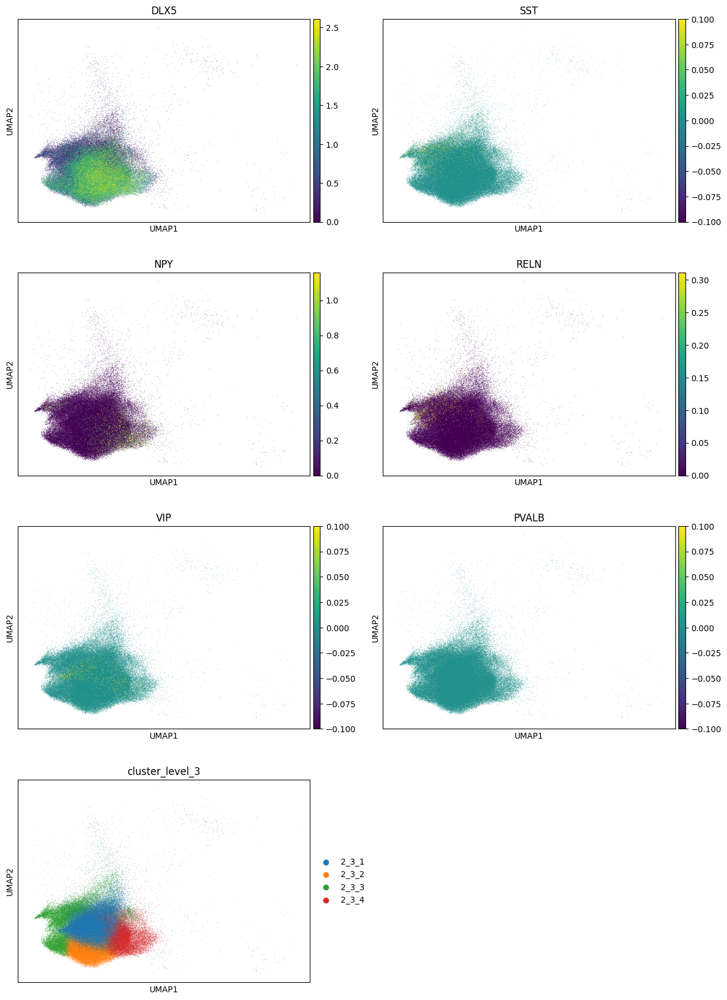

In [10]:
sc.pl.umap(adata[adata.obs['cluster_level_2'] == '2_3'], color=['DLX5', 'SST', 'NPY', 'RELN', 'VIP', 
                                                                'PVALB', 'cluster_level_3'],
           ncols=2, layer='log1p_norm', vmax='p99')

/home/deepak/pixi_envs/scanvi/.pixi/envs/default/lib/python3.11/site-packages/anndata/_core/anndata.py:1138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/deepak/pixi_envs/scanvi/.pixi/envs/default/lib/python3.11/site-packages/anndata/_core/anndata.py:1138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/deepak/pixi_envs/scanvi/.pixi/envs/default/lib/python3.11/site-packages/anndata/_core/anndata.py:1138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/deepak/pixi_envs/scanvi/.pixi/envs/default/lib/python3.11/site-packages/anndata/_core/anndata.py:1138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


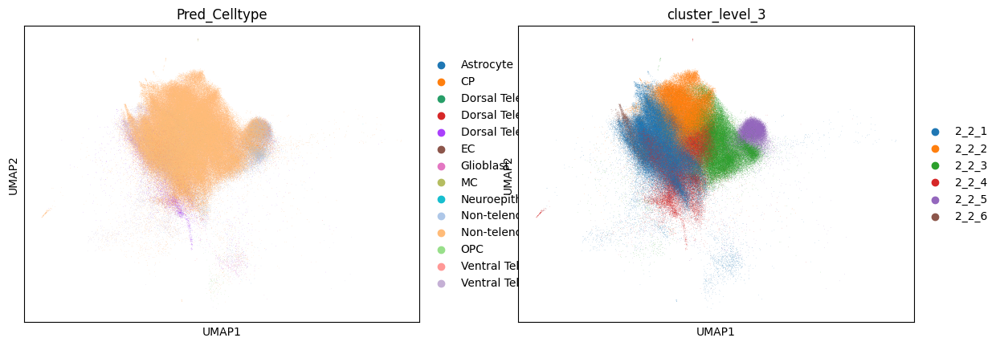

In [11]:
sc.pl.umap(adata[adata.obs['cluster_level_2'] == '2_2'], color=['Pred_Celltype', 'cluster_level_3'], layer='log1p_norm', vmax='p99')

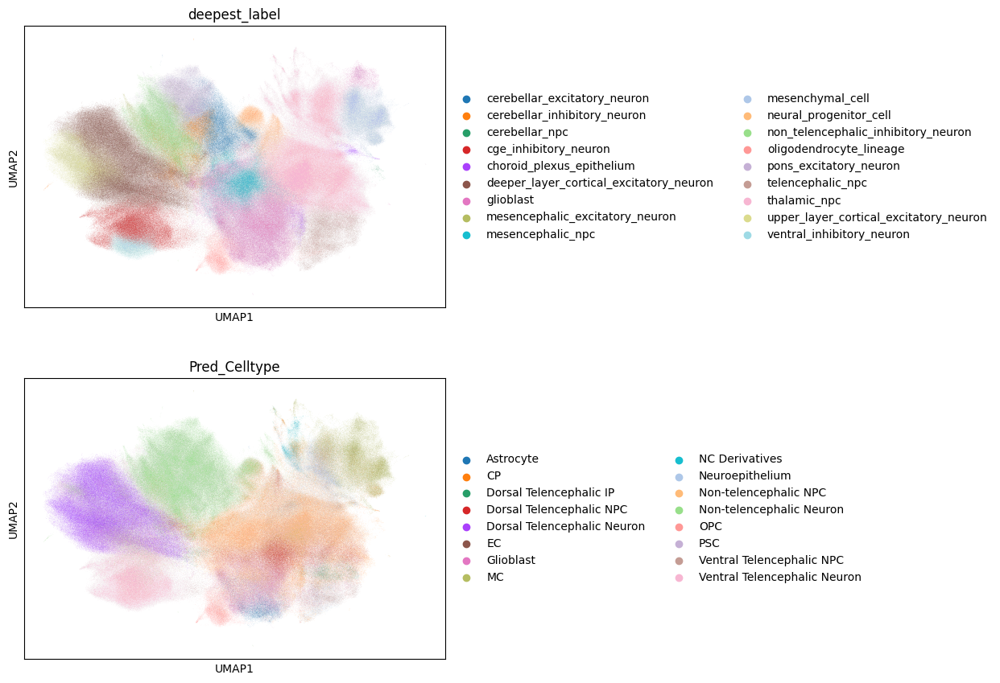

In [12]:
sc.pl.umap(adata, color=['deepest_label', 'Pred_Celltype'], 
           layer='log1p_norm', vmax='p99', ncols=1)

In [13]:
## Class ##

## VIM NES SOX2 HES1 HES4 HES5 FGFR1 ID3 - glial 

## GAP43 SOX11 MAP2 MAPT NRXN1 NCAM1 GRIA4 - neural

In [14]:
subclass_dict = {'1_1':'Ithmus Progenitors', '1_2':'Glia', '1_3':'Fibroblast', '2_1':'Telencephalic neuron',
                 '2_2':'Non-Telencephalic Neuron', '2_3':'Ventral Telencephalic Neuron'}

subtype_dict = {'1_1_1':'Ithmus Radial Glia PTPRZ1+HES1+EN1+', 
                '1_1_2':'Proliferating Radial Glia H1-2+H1-3+H1-4+', 
                '1_1_3':'Ithmus Radial Glia NFIB+SOX4+MKI67+', 
                '1_1_4':'Proliferating Radial Glia TOP2A+CCNB11+', 
                '1_1_5':'Choroid Plexus TTR+OTX2+MSX1+', 
                '1_1_6':'Fibroblast Progenitors S100B+COL11A11+TAGLN+', 

                '1_2_1':'Outer Radial Glia FABP7+PTPRZ1+HOPX+',
                '1_2_2':'Stressed Radial Glia FTL+SLC16A3+MCT4+',
                '1_2_3':'Hypothalamic/Spinal Cord Radial Glia IRX2+IRX5+PAX3+',
                '1_2_4':'OPC/Oligodendrocyte OLIG1+OLIG2+PDGRFA',
                '1_2_5':'Unknown Glia',
                '1_2_6':'Unknown Glia',

                '1_3_1':'Mesenchymal Fibroblast KRT18+KRT19+',
                '1_3_2':'Neural Crest Mesenchymal Cells TWIST1+NR2F1+NR2F2+',
                '1_3_3':'Neural Crest Schwann Cells SOX10+MPZ+PAX3+',
                '1_3_4':'Mesenchyaml Fibroblast COL1A1+COL1A2+',
                '1_3_5':'Hypothalamic/Thalamic Progenitor SST+SOX11+ISL1+',
                '1_3_6':'Skeletal Muscle TTN+RYR1+CHRNA1+',

                '2_1_1':'Dorsal Telencephalic Neurons & IPC NEUROD2+PAX6+FOXG1+EOMES+',
                '2_1_2':'Dorsal Telencephalic Neurons (Deep Layer) NEUROD2+FEZF2+BCL11B+',
                '2_1_3':'Dorsal Telencephalic Neurons (Upper Layer)  NEUROD2++SATB2+POU3F2+',
                '2_1_4':'Stressed Neural Cluster NEUROD2+FTL+DDIT3+',
              
                '2_2_1':'Early Born Telencephalic Neurons FABP7+MAPT+GRIN2B',
                '2_2_2':'Hypothalamic Neurons IRX2+IRX3+NMU+',
                '2_2_3':'Posterior Radial Glia HES6+NES+EBF2+',
                '2_2_4':'Cerebellar Excitatory Neurons TFAP2A+SKOR2+CA8+',
                '2_2_5':'Early Cycling Radial Glia VIM+HES4+TOP2A+',
                '2_2_6':'IPC/Dorsal Telencephalic Neurons (Deep Layer)/CR Cell TBR1+TP73+RELN+EOMES+',

                '2_3_1':'CGE Interneurons DLX5+NR2F2+NR2F1',
                '2_3_2':'Early Born GABAergic Neurons DLX5+MEIS2+FABP7+',
                '2_3_3':'GABAergic Neuron DLX5+MEIS2+MAPT+',
                '2_3_4':'Early born GABAergic Neuron DLX5+HES6+SFRP1+'}

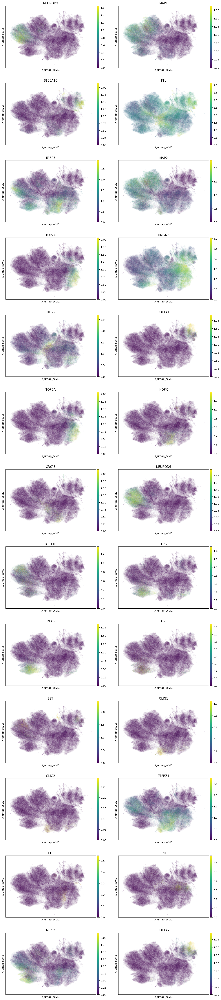

In [21]:
## Examine Clusters By Gene Expression ##

sc.pl.embedding(adata_hvg, basis='X_umap_scVI', color=['NEUROD2', 'MAPT', 'S100A10', 'FTL', 'FABP7',
                                                       'MAP2', 'TOP2A', 'HMGN2', 'HES6', 'COL1A1', 'TOP2A', 
                                                       'HOPX', 'CRYAB', 'NEUROD6', 'BCL11B', 'DLX2', 'DLX5', 
                                                       'DLX6', 'SST', 'OLIG1', 'OLIG2', 'PTPRZ1',
                                                       'TTR', 'EN1', 'MEIS2', 'COL1A2'], layer='log1p_norm', vmax='p99', ncols=2)

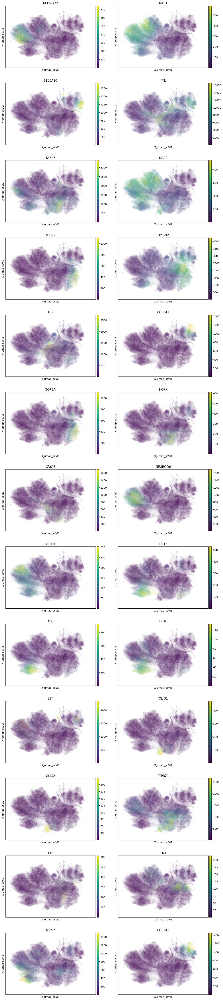

In [22]:
## Examine Clusters By Gene Expression ##

sc.pl.embedding(adata_hvg, basis='X_umap_scVI', color=['NEUROD2', 'MAPT', 'S100A10', 'FTL', 'FABP7',
                                                       'MAP2', 'TOP2A', 'HMGN2', 'HES6', 'COL1A1', 'TOP2A', 
                                                       'HOPX', 'CRYAB', 'NEUROD6', 'BCL11B', 'DLX2', 'DLX5', 
                                                       'DLX6', 'SST', 'OLIG1', 'OLIG2', 'PTPRZ1',
                                                       'TTR', 'EN1', 'MEIS2', 'COL1A2'], layer='scvi_normalized', vmax='p99', ncols=2)

In [15]:
# 2_3_1 - NR2F2 NR2F1 CXCR4 MSX2 - CGE interneurons (NR2Fs)
# 2_3_2 - ETV1 MEIS2 FABP7 CALB2 NRXN1 SP8 KITLG SALL3 PTPRG - early born CGE neurons calretinin+ (SCGN, CALB2, NXPH1, NRP2)
# 2_3_3 - MEIS2 GRIA2 CNTNAP2 GAP43 GRIN2B MAPT PBX1/3, ARPP21 CELF4/5 - unspecifed interneuron interneuron
# 2_3_4 - GAD2 PAX6 MDK HES6 SFRP1 - unspecified ventral interneuron, likely early born

In [16]:
# Subclasses ##

# 1_1 - isthmus progenitors
# FGF17 PAX5 HBZ EN1 PAX8 WNT4 BARHL1 EN2 EOMES TOP2A GAD2 HBA1 MK67 HBA2 BARHL2 WNT3A - LOGFC
# TOP2A MKI67 HES6 EN2 by score - proliferating RG/astrocyte
# midbrain-hindbrain boundary & proliferating progenitors

# 1_1_1 - PTPRZ1 HES1 TLE4 SPRY1 FGFR1 EN1 - ithmus progenitors
# 1_1_2 - H1-2, H1-3, H1-4, H1-5 - proflierating
# 1_1_3 - SOX4 NFIB HES6 TOP2A MKI67 DLX2 - proliferating
# 1_1_4 - TOP2A CCNB1 CCNB2 PLK1  - proliferateing
# 1_1_5	- TTR  RSPO2 OTX2 MSX1 - choroid plexus
# 1_1_6 - S100B COL11A1 TAGLN - stroamal cells or fibroblast progenitors

# 1_2 - radial glia (pan glia)
# AQP4 BCAN NKX2-2 CRYAB FGF1 GFAP CYP26B1 OLIG1 SFRP4 NRXN1 GRIA2 SLIT1 MAPT GASB1B SOX9 - LOGFC
# PTPRZ1 FABP7 ID4 MAP2 ZBTB20 HES5 CRYAB NRXN1 - scores
# radial glia (v/t-RG) and oligodendrocytes and astrocytes

# 1_2_1 FABP7 ID4 PTPRZ1 SOX2 SOX9 HES1 HOPX JUN DKK3 ZBTB20 NRXN1 AQP4 EGR1 - canonical RG
# 1_2_2 - stress lactate export (SLC16A3 / MCT4) hypoxia signaling (NDUFA4L2, ANKRD37, EGLN3) - stress
# 1_2_3 - NR2F1 IRX2 VIM HES6 PAX3 IRX5 IRX3 POU3F2 HES5 SOX11 PAX7 - hypothalalmus/spinal cord is IRX, PAX3/PAX7 - spinal cord/neural crest
# 1/2 astrocyte 1/2 spinal cord progenitors 
# 1_2_4 - OLIG1 BCAN PTPRZ1 PDGFRA OLIG2 MAP2 SEMA5A FOS - OPC but a tiny tail is Oligo MBP MOG PLP1 CNP+
# 1_2_5 - no markers
# 1_2_6 - few cells

# 1_3 - fibroblast
# COL3A1 POSTN COL1A1 COL6A3 LUM IGFBP3 COL15A1 TWIST1 KDR COL1A2 KRT19 ISL1 KRT8
# COL3A1 LUM COL1A2 DCN COL1A1 FRZB IGFBP3 COL6A2 KRT18 - scores
# fibroblast

# 1_3_1 - KRT18 KRT19 S100A10 COL3A1 KRT8 LUM DCN - mesenchyaml fibroblast
# 1_3_2 - TWIST1 NR2F1 NR2F2 SOX4 SOX11 - neural crest derived mesenchyme 
          #TWIST1 + PRRX1 → mesenchymal / craniofacial mesenchyme 
          #NR2F1 + NR2F2 + SOX11+ SOX4 → neural crest 
# 1_3_3 - S100B PTPRZ1 SOX10 ERBB3 TFAP2B MPZ PAX3 - neural crest derived schwann cells
# 1_3_4 - COL1A1 COL1A2 COL6A1 COL6A2 VCAN COL3A1 COL6A3 FOS DCN LUM FGFR1 TCF4 - mesenchymal fibroblast
# 1_3_5 - SST PPP1R17 NEUROD1 HES6  ISL1 SOX11 - SST/SOX11/ISL1 = hypothalalmic/thalamic progenitor, probably thalamic
# 1_3_6 - TPM2 ACTC1 ACTA1 TNNC2 TNNI1 MYLPF MYH3 TTN NEB DES RYR1 CHRNA1 (cardiac uses RYR2 and dosent have CHRNA1)  - skeletal muscle

# 2_1 - telencephalic neurons
# FEZF2 EMX1 NEUROD6 SATB2 NEUROD2 TBR1 CLMP NEUROG2 EOMES PVALB IGF1 LHX2 SST PTPRZ1 PDGFD EMX2 NOS1 FOXG1 - LOGFC
# NEUROD6 FOXG1 TCF4 CNTNAP2 TBR1 FEZF2 BCL11B LHX2 EMX1 NEUROG2 GRIA1 RORB SATB2 - scores 
# excitatory neuron + IPC + PVALB/SST/NOS1 suggests IN

# 2_1_1 - SOX11 HES6 ZBTB20 MDK NR2F1 SOX2 EOMES SOX6 PAX6 - dorsal telencephalic cneurons
# 2_1_2 - CNTNAP2 GRIA2 SOX5 FEZF2 BCL11A BCL11B GABRB3 - deep layer neuron
# 2_1_3 - FABP7 SATB2 POU3F2 STMN2 (CUX2 may not come up but there) - upper layer neuron
# 2_1_4 - FTL, DDIT3, DDIT4, ATF3, ATF5, XBP1, HSPA5, DNAJB9, HSPB1 - stressed neural cluster

# 2_2 - non-telencephalic neurons
# SKOR2 SIX2 LMX1B LHX1 IRX5 TFAP2A PAX7 LHX5 PAX3 PAX2 NKX2-2 BMP5 SKOR1 CALB1 ISL1 - LOG2FC
# NR2F1 NR2F2 LHX1 IRX3 IRX5 IRX2 TLE4 GRID2 LHX5 IRX1 VIM FOXP2 VGF
# cerebellum vs hypothalamic (IRX)

# 2_2_1 - MAPT GRIN2B CAMK2B FABP7 FOS GABRB3 GABRG2 CALB2 AHI1 - undefined telencephali neurons .. best we can do. 
# 2_2_2 - IRX3 IRX5 IRX2 TLX3 GRIA4 SLC17A6 ONECUT1 [NMU DIO3 OTP TNXIP LMX1A/B]-most clearly hypothalamic - hypothalamus 
# 2_2_3 - VIM MDK TAGLN3 HES6 NES CXCR4 NEUROD4 EBF2 - radial glia towards hindbrain/brainstem/hypothalamus but who knos
# 2_2_4 - LHX1 GRIA2 FOXP2 TFAP2A BCL11A RORA SKOR2 NRXN3 EPHA4 FOXP1 CA8 - cerebellar excitatory neuron
# 2_2_5 - VIM HES4 IGFBP2 TOP2A CDC20 - early cycling radial glia
# 2_2_6 - SLC17A6 TBR1 EMX2 TP73 RSPO3 EOMES BARHL2 LHX5 LHX9 - IPC-> deep layer vs CR mixture

# 2_3 - GABAergic neuron
# SCGN VIP DLX5 SP8 SALL3 DLX2 DLX1 GSX2 COL1A2 DLX6 SALL1 SOX9 WNT5A PDZRN3 NOG GAD2 KITLG SOX2 CALB2 - 
# DLX5 SOX4 DLX2 SCGN DLX1 GAD2 MEIS2 FABP7 SP8 CALB2 DLX6 SOX9 FOXG1 PDZRN3 - scores
# interneurons VIP+

# 2_3_1 - NR2F2 NR2F1 CXCR4 MSX2 - CGE interneurons (NR2Fs)
# 2_3_2 - ETV1 MEIS2 FABP7 CALB2 NRXN1 SP8 KITLG SALL3 PTPRG - early born CGE neurons calretinin+ (SCGN, CALB2, NXPH1, NRP2)
# 2_3_3 - MEIS2 GRIA2 CNTNAP2 GAP43 GRIN2B MAPT MEIS2, PBX1/3, ARPP21 CELF4/5 - unspecifed interneuron interneuron
# 2_3_4 - GAD2 PAX6 MDK HES6 SFRP1 - unspecified ventral interneuron, likely early born